# Simulating Relax displacements with a basal dislocation

## Getting a sense for the output: Make a single pyGMT plot

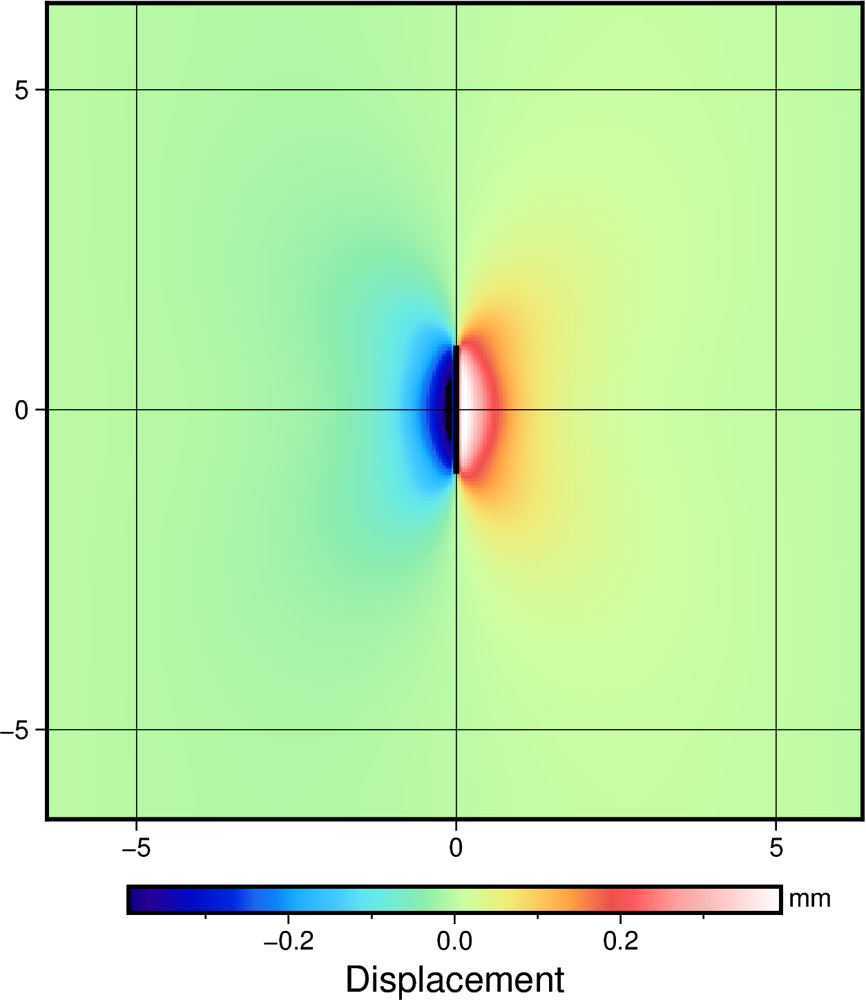

In [1]:
import pygmt

directory = "/Users/jloveles/Documents/relax/examples/tutorials/output2/"
pathname = directory + "000-north.grd"
faultname = "/Users/jloveles/Documents/relax/examples/tutorials/output2/rfaults-001.xy"
grid = pygmt.load_dataarray(pathname)

# Get z limits from grdinfo
info = pygmt.grdinfo(pathname, nearest_multiple="+a0.1")

fig = pygmt.Figure()
pygmt.makecpt(cmap="haxby", series=info[2:])
fig.grdimage(grid=grid, projection="X10c", frame="ag")
fig.colorbar(frame=["x+lDisplacement", "y+lmm"])

pygmt.makecpt(cmap="gray", series=[0, 2000])
fig.plot(faultname, cmap=True, close=True, pen="2p")

fig.show()

## Set up triangular dislocation sources

In [2]:
def tri_horizon(x, y, z, el_size):
    # Makes a simple ~horizon of triangular dislocation elements using Gmsh
    # x, y are 2-element arrays defining horizontal bounds
    # z is a scalar giving depth 
    # el_size gives nominal element size 

    import gmsh
    import meshio
    
    # Mesh construction using Gmsh
    gmsh.initialize()
    # Define points
    gmsh.model.geo.addPoint(x[0], y[0], z+0.01, el_size, 1)
    gmsh.model.geo.addPoint(x[1], y[0], z-0.01, el_size, 2)
    gmsh.model.geo.addPoint(x[1], y[1], z-0.01, el_size, 3)
    gmsh.model.geo.addPoint(x[0], y[1], z+0.01, el_size, 4)
    # Boundary lines
    gmsh.model.geo.addLine(1, 2, 1)
    gmsh.model.geo.addLine(2, 3, 2)
    gmsh.model.geo.addLine(3, 4, 3)
    gmsh.model.geo.addLine(4, 1, 4)
    # Perimeter
    gmsh.model.geo.addCurveLoop([1, 2, 3, 4], 1)
    # Surface
    gmsh.model.geo.addPlaneSurface([1], 1)
    gmsh.model.geo.synchronize()
    # Generate and write. Writing a file allows use of meshio, consistent with celeri codes
    gmsh.model.mesh.generate(2)
    gmsh.write("file.msh")
    gmsh.finalize()

    # Read and parse mesh
    mesh = meshio.read("file.msh")
    fault_pts = mesh.points
    fault_tri = meshio.CellBlock("triangle", mesh.get_cells_type("triangle")).data
    return fault_pts, fault_tri

## Define source mesh and horizon, calculate partials

In [3]:
import cutde.halfspace as cutde_halfspace
import numpy as np
import pandas as pd
import xarray as xa
import addict
import celeri

# Get stations from grid plotted above
gsubset = 10 # Subset of grid points: increment every gsubset points along grid
xg = np.array(grid.x)
yg = np.array(grid.y)
Xg, Yg = np.meshgrid(xg, yg)
obsg = np.array([Xg[0::gsubset, 0::gsubset], Yg[0::gsubset, 0::gsubset], 0*Yg[0::gsubset, 0::gsubset]]).reshape((3, -1)).T.copy()

# Define source fault
meshes = []
meshes.append(addict.Dict())
source_len = 2
source_ldep = -1
source_bdep = 0
meshes[0].coords = np.array([[0.01, -source_len/2, source_bdep], [0.01, source_len/2, source_bdep], [0.01, source_len/2, source_ldep], [0.01, -source_len/2, source_ldep]])
meshes[0].verts = np.array([[0, 1, 2], [0, 2, 3]], dtype=np.int64)

# Define horizontal mesh
meshes.append(addict.Dict())
meshes[1].coords, meshes[1].verts = tri_horizon([-10, 10], [-10, 10], -2, 1)
nsource_tri = np.shape(meshes[0].verts)[0]
nhoriz_tri = np.shape(meshes[1].verts)[0]
ntri = nsource_tri + nhoriz_tri

# Concatenate source and horizontal
source_tri_pts = meshes[0].coords[meshes[0].verts]
horiz_tri_pts = meshes[1].coords[meshes[1].verts]
all_tri_pts = np.concatenate((source_tri_pts, horiz_tri_pts), axis=0)

# Calculate element normals, strike and dip
meshes[0].normal_vector = np.cross(source_tri_pts[:, 1, :] - source_tri_pts[:, 0, :], source_tri_pts[:, 2, :] - source_tri_pts[:, 0, :])
meshes[1].normal_vector = np.cross(horiz_tri_pts[:, 1, :] - horiz_tri_pts[:, 0, :], horiz_tri_pts[:, 2, :] - horiz_tri_pts[:, 0, :])

# Calculate TDE partials for the subset array
disp_mat = cutde_halfspace.disp_matrix(obs_pts=obsg, tris=all_tri_pts, nu=0.25)

# Calculate TDE partials for the full array, for comparison with full Relax grid
obsg_full = np.array([Xg, Yg, 0*Yg]).reshape((3, -1)).T.copy()
disp_mat_full = cutde_halfspace.disp_matrix(obs_pts=obsg_full, tris=all_tri_pts, nu=0.25)

Info    : Meshing 1D...
Info    : [  0%] Meshing curve 1 (Line)
Info    : [ 30%] Meshing curve 2 (Line)
Info    : [ 50%] Meshing curve 3 (Line)
Info    : [ 80%] Meshing curve 4 (Line)
Info    : Done meshing 1D (Wall 0.000178834s, CPU 0.000266s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.00897392s, CPU 0.007606s)
Info    : 513 nodes 1028 elements
Info    : Writing 'file.msh'...
Info    : Done writing 'file.msh'



# Set up inversion of Relax displacements

## Matrix assembly

In [4]:
# Get triangular smoothing matrix

operators = addict.Dict()
celeri.get_all_mesh_smoothing_matrices_simple(meshes, operators)

# Assemble matrices
assembled_mat = np.zeros((np.size(obsg)+3*ntri, 3*ntri))
# Insert elastic partials
assembled_mat[0:np.size(obsg), :] = disp_mat.reshape((-1, 3*ntri))
# Insert smoothing matrices
source_row_start = np.size(obsg)
source_row_end = np.size(obsg) + 3*nsource_tri
assembled_mat[source_row_start:source_row_end, 0:3*nsource_tri] = operators.smoothing_matrix[0].toarray()
assembled_mat[source_row_end:, 3*nsource_tri:] = operators.smoothing_matrix[1].toarray()

# Assemble weighting vector
smoothing_weight = 1e-3
weights = np.ones((np.shape(assembled_mat)[0], 1))
weights[source_row_start:] = smoothing_weight

## Sequential reading and inversion of displacement grids

In [5]:
import glob

# Read sequence of displacement grd files and invert
e_disp_file_list = sorted(glob.glob(directory + "*-relax-east.grd"))
n_disp_file_list = sorted(glob.glob(directory + "*-relax-north.grd"))
u_disp_file_list = sorted(glob.glob(directory + "*-relax-up.grd"))

# Allocate space for estimated slip and predicted displacements
est_slip = np.zeros((3*ntri, len(e_disp_file_list)))
pred_disp = np.zeros((obsg_full.size, len(e_disp_file_list)))

# Allocate space for data vector
data_vector = np.zeros(source_row_start+3*ntri)

# Calculate model covariance
cov = np.linalg.inv(assembled_mat.T * weights.T @ assembled_mat) 

# Read each file and invert 
for i in range(len(e_disp_file_list)):
    # Read components
    e_disp = pygmt.load_dataarray(e_disp_file_list[i])
    n_disp = pygmt.load_dataarray(n_disp_file_list[i])
    u_disp = pygmt.load_dataarray(u_disp_file_list[i])
    # Take the same subset as when setting up partials
    disp_array = np.array([e_disp[0::gsubset, 0::gsubset], n_disp[0::gsubset, 0::gsubset], u_disp[0::gsubset, 0::gsubset]]).reshape((3, -1)).T.copy()
    data_vector[0:source_row_start] = disp_array.flatten()
    # Estimate slip using pre-calculated covariance
    est_slip[:, i] = cov @ assembled_mat.T * weights.T @ data_vector 
    # Predict displacement at the full grid resolution
    pred_disp[:, i] = disp_mat_full.reshape((-1, 3*ntri)).dot(est_slip[:, i])   


## Plot results

### Displacement grids (pyGMT; north component only)

In [6]:

# Get z limits from grdinfo
info = pygmt.grdinfo(n_disp_file_list[-1], nearest_multiple="+a0.01")

# Make a time series array for all north displacements
n_disp_array = np.zeros((np.shape(obsg_full)[0], len(n_disp_file_list)))

# For all time steps,
for i in range(len(n_disp_file_list)):
    # Convert predicted displacements to xarrays
    eastdispg = xa.DataArray.copy(grid)
    eastdispg.values = np.reshape(pred_disp[0::3, i], (256, 256))
    northdispg = xa.DataArray.copy(grid)
    northdispg.values = np.reshape(pred_disp[1::3, i], (256, 256))
    updispg = xa.DataArray.copy(grid)
    updispg.values = np.reshape(pred_disp[2::3, i], (256, 256))
    # Read in Relax displacements
    n_disp = pygmt.load_dataarray(n_disp_file_list[i])
    # Add to an array for later displacement vs. time plot
    n_disp_array[:, i] = np.array(n_disp).flatten()
    # Residual displacements: Relax - TDE predicted (not currently plotted)
    diffgrid = n_disp - northdispg
    
    # pyGMT figure: 2 panels, TDE and Relax
    fig = pygmt.Figure()
    pygmt.makecpt(cmap="haxby", series=info[2:])
    with fig.subplot(nrows=1, ncols=2, figsize=("22c", "6c")):
         with fig.set_panel(panel=0):
             # TDE predictions
             fig.grdimage(grid=northdispg, projection="X10c", frame=["ag", f"+tTDE, step {i}"])
             fig.colorbar(frame=["x+lDisplacement", "y+lmm"])
         with fig.set_panel(panel=1):
             # Relax grid
             fig.grdimage(grid=n_disp, projection="X10c", frame=["ag", f"+tRelax, step {i}"])
             fig.colorbar(frame=["x+lDisplacement", "y+lmm"])

    # fig.show()
    fig.savefig(f"png/ndisplacement_{i}.png")

### Basal slip distribution (matplotlib)

In [7]:
import matplotlib 
from matplotlib import pyplot as plt

# Plot a single mesh; modified from celeri_vis.py
def plot_mesh(mesh, fill_value, ax):
    x_coords = mesh.coords[:, 0]
    y_coords = mesh.coords[:, 1]
    vertex_array = np.asarray(mesh.verts)

    if not ax:
        ax = plt.gca()
    xy = np.c_[x_coords, y_coords]
    verts = xy[vertex_array]
    pc = matplotlib.collections.PolyCollection(
        verts, edgecolor="none", cmap="rainbow"
    )
    pc.set_array(fill_value)
    ax.add_collection(pc)
    ax.autoscale()
    pc.set_clim([-0.02, 0.02])
    plt.colorbar(pc, label="Strike-slip (N-S)")

### Plot for each time step

/var/folders/fg/yxk4m2b97gd8fx9whgk386y5szvp8k/T/ipykernel_65701/2648232364.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


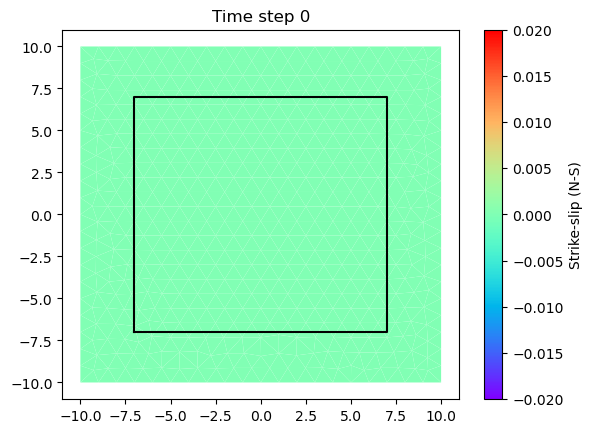

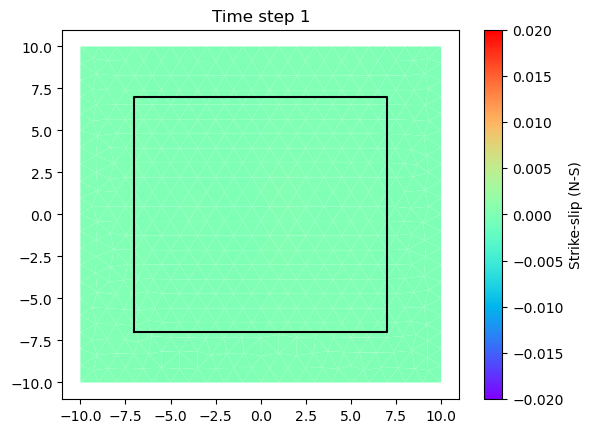

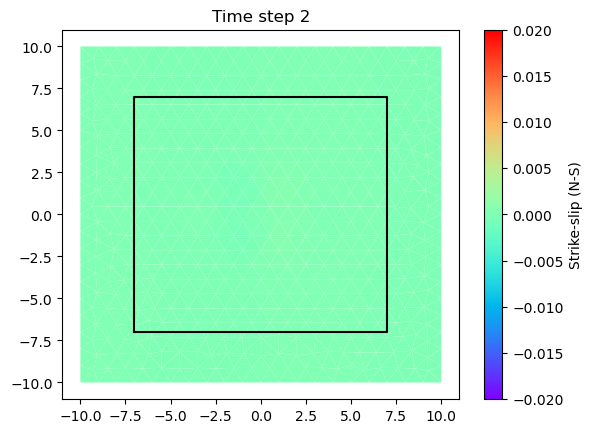

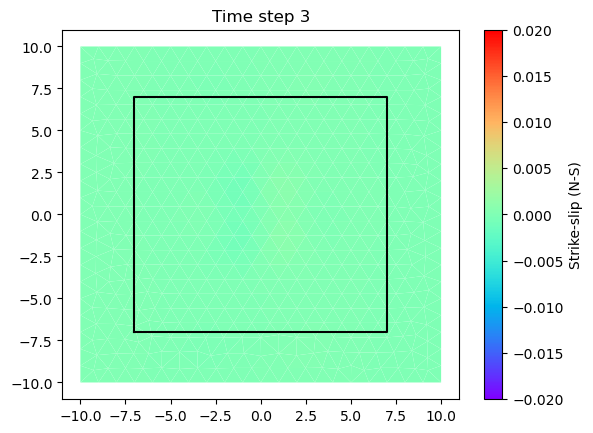

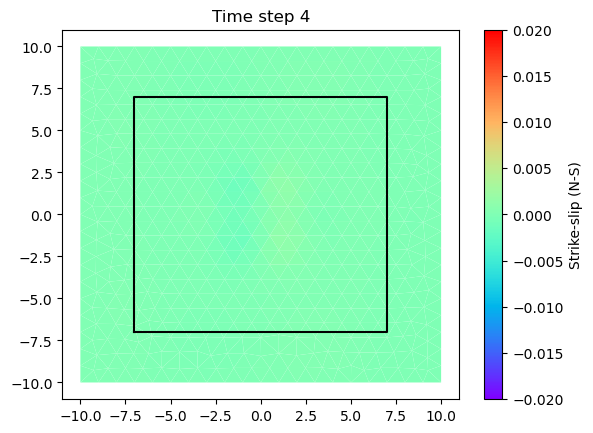

...

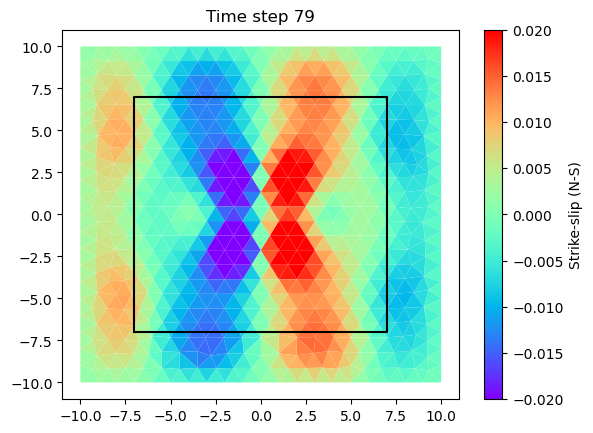

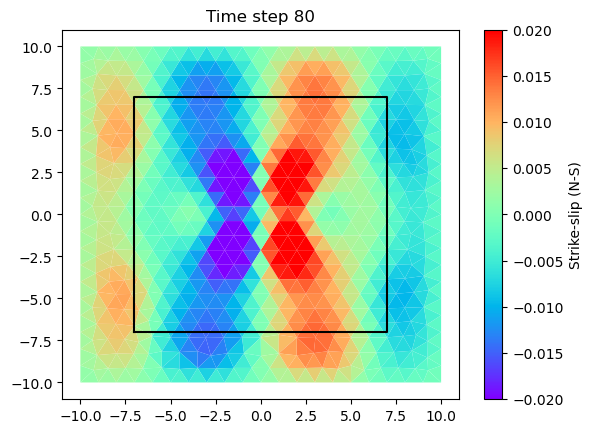

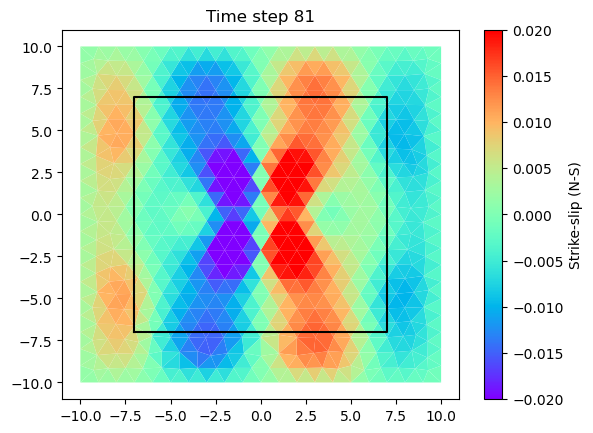

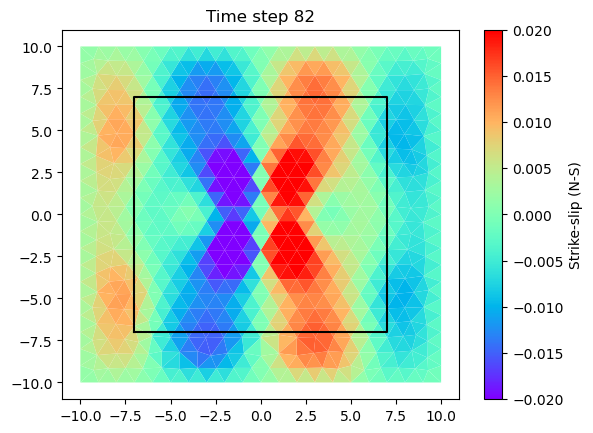

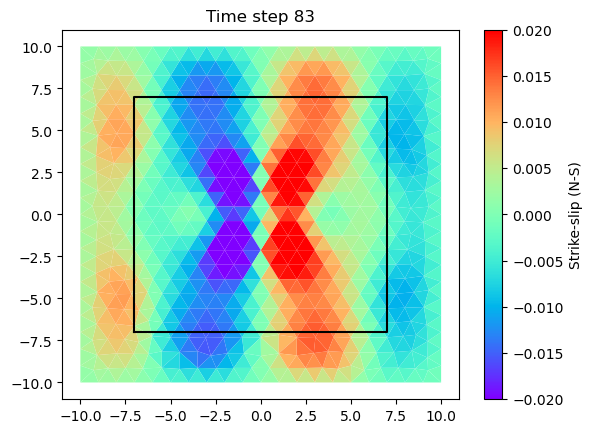

In [8]:
plt.close("all")
for i in range(len(n_disp_file_list)):
    fig, ax = plt.subplots()
    plot_mesh(meshes[1], est_slip[3*nsource_tri+0::3, i], ax)
    ax.plot([-7, 7, 7, -7, -7], [-7, -7, 7, 7, -7], 'k')
    ax.set_title(f"Time step {i}")
    fig.savefig(f"png/horizslip_{i}.png")

### Displacement vs. time at selected points

/var/folders/fg/yxk4m2b97gd8fx9whgk386y5szvp8k/T/ipykernel_65701/1669548658.py:36: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


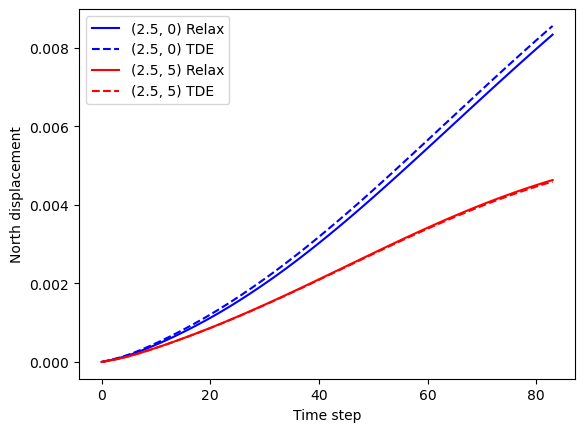

In [9]:
# Get target coordinates
c1 = [2.5, 0]
c2 = [2.5, 5]
# Coordinate indices
grididx1 = np.where((obsg_full[:, 0]==c1[0]) & (obsg_full[:, 1]==c1[1]))[0]
grididx2 = np.where((obsg_full[:, 0]==c2[0]) & (obsg_full[:, 1]==c2[1]))[0]
# Observed and predicted displacements
obsdisp1 = n_disp_array[grididx1, :]
obsdisp2 = n_disp_array[grididx2, :]
preddisp1 = pred_disp[3*grididx1-2, :]
preddisp2 = pred_disp[3*grididx2-2, :]

# Find element centroid nearest target coordinates
horiz_centroids = np.mean(horiz_tri_pts, axis=1)
dist1 = np.sqrt((horiz_centroids[:, 0] - c1[0])**2 + (horiz_centroids[:, 1] - c1[1])**2)
dist2 = np.sqrt((horiz_centroids[:, 0] - c2[0])**2 + (horiz_centroids[:, 1] - c2[1])**2)
el_idx1 = np.argmin(dist1)
el_idx2 = np.argmin(dist2)
slip1 = est_slip[3*(nsource_tri+el_idx1), :]
slip2 = est_slip[3*(nsource_tri+el_idx2), :]

# Set up figure
fig, ax1 = plt.subplots()
ax1.plot(obsdisp1[0, :], 'b', label="(2.5, 0) Relax")
ax1.plot(preddisp1[0, :], 'b--', label="(2.5, 0) TDE")
ax1.plot(obsdisp2[0, :], 'r', label="(2.5, 5) Relax")
ax1.plot(preddisp2[0, :], 'r--', label="(2.5, 5) TDE")
ax1.legend()
ax1.set_xlabel('Time step')
ax1.set_ylabel('North displacement')
# ax2 = ax1.twinx()
# ax2.plot(slip1, 'b', linewidth=3)
# ax2.plot(slip2, 'r', linewidth=3)
# ax2.set_ylabel('Strike-slip (towards north)')

fig.show()
fig.savefig(f"png/timeseries.png")